# CSAFE All-Hands Meeting Materials

In [1]:
import numpy as np
import pandas as pd
import os
import sys

from kde.location_project.kde_2d import (
    kdnearest, 
    learn_nearest_neighbors_bandwidth, 
    plot_kde,
    sample_from_kde
)
from kde.location_project.cmp import (
    calc_cmp,
    plot_scatter
)
from emd import emd

import matplotlib.pyplot as plt
import plotly
from plotly.offline import (
    download_plotlyjs, init_notebook_mode, plot, iplot
)
import plotly.graph_objs as go
import seaborn as sns
%matplotlib inline
init_notebook_mode(connected=True)

sys.setrecursionlimit(10000)
# # turn off SettingWithCopyWarning
# pd.options.mode.chained_assignment = None 

%load_ext autoreload
%autoreload 2

np.random.seed(1234)
directory = os.path.join("..", "data") 

# load the data
mpp = pd.read_csv(os.path.join(directory, "mpp_visits_month0a_month1b_n20.csv"))
mpp = mpp.loc[mpp.uid != 55]

pop_deduped = pd.read_csv(os.path.join(directory, "parcel_ass-oc-visits-ass_events_deduped_bw.csv"))
pop_kde_data = np.array(pop_deduped[['uid', 'lon', 'lat', 'bw']])

In [2]:
same = pd.read_csv(os.path.join(directory, "cmp_visits_emd_month0a_month1b_n20_same-src.csv"))
diff = pd.read_csv(os.path.join(directory, "cmp_visits_emd_month0a_month1b_n20_diff-src.csv"))
same.head()

,a,b,cmp_emd,cmp_mean,cmp_median,obs_emd,obs_mean,obs_med
0,1,1,0.000,0.019,0.290,2.850063,1.418317,0.213054
1,2,2,0.089,0.002,0.149,4.492128,0.095793,0.018493
2,3,3,0.004,0.227,0.816,2.221099,1.132664,0.782652
3,4,4,0.040,0.468,0.619,4.592424,2.778921,0.533464
4,5,5,0.425,0.007,0.258,7.572475,1.776469,0.668625


In [3]:
print(diff.shape)
diff.head()

(250, 8)


,a,b,cmp_emd,cmp_mean,cmp_median,obs_emd,obs_mean,obs_med
0,160,200,0.614,0.472,0.484,12.656779,2.382638,2.125570
1,172,188,0.189,0.189,0.133,22.946871,22.954903,23.542726
2,140,191,0.953,0.846,0.846,21.565677,4.384737,4.384737
3,73,35,0.577,0.448,0.534,10.137107,2.431760,2.284352
4,88,65,0.422,0.393,0.894,7.311799,3.405707,3.149507


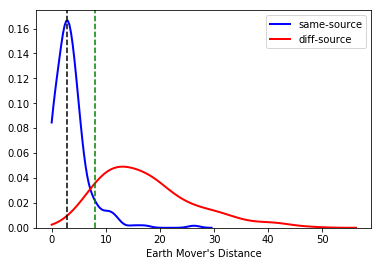

In [4]:
ax = sns.kdeplot(
    same['obs_emd'], 
    color = 'blue',
    lw=2,
    clip=(0,100),
    label='same-source'
)
sns.kdeplot(
    diff['obs_emd'], 
    color = 'red',
    lw=2,
    clip=(0,100),
    label='diff-source'
)
plt.axvline(2.85, 0, 1, color='black', ls='dashed')  # User 1 same
plt.axvline(7.976842, 0, 1, color='green', ls='dashed')  # Users {72, 88}
ax.set(xlabel="Earth Mover's Distance")
plt.show()

In [5]:
# plot_scatter(mpp=mpp, df=pop_deduped, uid=107, uidB=66)
plot_scatter(mpp=mpp, df=pop_deduped, uid=72, uidB=88)

In [6]:
plot_scatter(mpp=mpp, df=pop_deduped, uid=1)

In [7]:
print(same['cmp_emd'].loc[same.a == 1])
print(same['obs_emd'].loc[same.a == 1])

0    0.0
Name: cmp_emd, dtype: float64
0    2.850063
Name: obs_emd, dtype: float64


In [8]:
print(diff['cmp_emd'].loc[(diff.a == 72) & (diff.b == 88)])
print(diff['obs_emd'].loc[(diff.a == 72) & (diff.b == 88)])

92    0.636
Name: cmp_emd, dtype: float64
92    7.976842
Name: obs_emd, dtype: float64
